In [1]:
# From WoFSCast
import sys, os 
sys.path.insert(0, os.path.dirname(os.path.dirname(os.getcwd())))

from wofscast import icosahedral_mesh, model_utils, square_mesh
from wofscast import grid_mesh_connectivity 
from wofscast.square_mesh import _ChildVerticesBuilder, TriangularMesh, merge_meshes

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.tri as mtri
import cartopy.crs as ccrs
from glob import glob
import math 

def _get_max_and_mean_edge_distance(mesh):
  senders, receivers = square_mesh.faces_to_edges(mesh.faces)
  edge_distances = np.linalg.norm(
      mesh.vertices[senders] - mesh.vertices[receivers], axis=-1)
  return edge_distances.max(), edge_distances.mean() 

def plot_mesh(ax, mesh, level, mesh_x=None, mesh_y=None, color='r', markersize=2, lw=0.5):
    
    if mesh_x is None: 
        mesh_x, mesh_y = mesh.vertices[:, 0], mesh.vertices[:, 1]
    
    triangulation = mtri.Triangulation(mesh_x, mesh_y, triangles=mesh.faces)
    ax.triplot(triangulation, 'go-', markersize=markersize, markerfacecolor='green',
               markeredgecolor='green', 
               lw=lw, color=color, alpha=0.9, zorder=15)
    #ax.set_title(f'Triangular Mesh Grid')
    return ax

# Modified plot_mesh function
def plot_mesh_from_point(ax, mesh, level, node_idx, color='r', markersize=2):
    vertices = mesh.vertices
    faces = mesh.faces

    # Create the triangulation
    triangulation = mtri.Triangulation(vertices[:, 0], vertices[:, 1], triangles=faces)
    
    # Plot the entire mesh
    #ax.triplot(triangulation, 'go-', markersize=markersize, lw=0.5, color='b')
    
    # Find and plot points connected to the specific node
    connected_points = set()
    for face in faces:
        if node_idx in face:
            connected_points.update(face)
    
    connected_points = list(connected_points)
    
    ax.plot(vertices[connected_points, 0], vertices[connected_points, 1], 'ro', markersize=markersize)
    ax.set_title(f'Triangular Mesh Grid')
    return ax

In [2]:
# Full WoFS domain file. 
base_path = '/work2/mflora/wofscast_datasets/dataset_10min_full_domain_test/2019'
name = 'wrfwof_2019-05-14_030000_to_2019-05-14_051000__10min__ens_mem_09.zarr'

dataset = xr.open_zarr(os.path.join(base_path, name))

In [3]:
# Specification of the multimesh.
mesh_size=5
N=150 # Keep at 150 for full domain, or otherwise the grid spacings are off!
tiling= (2,2)

meshes = square_mesh.get_hierarchy_of_tiled_triangular_meshes(tiling, 
                                                                  N, 
                                                                  mesh_size)
merged_meshes = square_mesh.merge_tiled_meshes(meshes)
    
finest_mesh = meshes[-1]

grid_lat = dataset['lat'].values
grid_lon = dataset['lon'].values

mesh_nodes_lon, mesh_nodes_lat = square_mesh.get_mesh_coords(finest_mesh, grid_lat, grid_lon)

max_dist, mean_dist = _get_max_and_mean_edge_distance(finest_mesh)

print(f'Max distance on Finest Mesh: {max_dist*3:.1f}km')
print(f'Mean distance on Finest Mesh: {mean_dist*3:.1f}km')

Max distance on Finest Mesh: 18.2km
Mean distance on Finest Mesh: 11.1km


<Axes: >

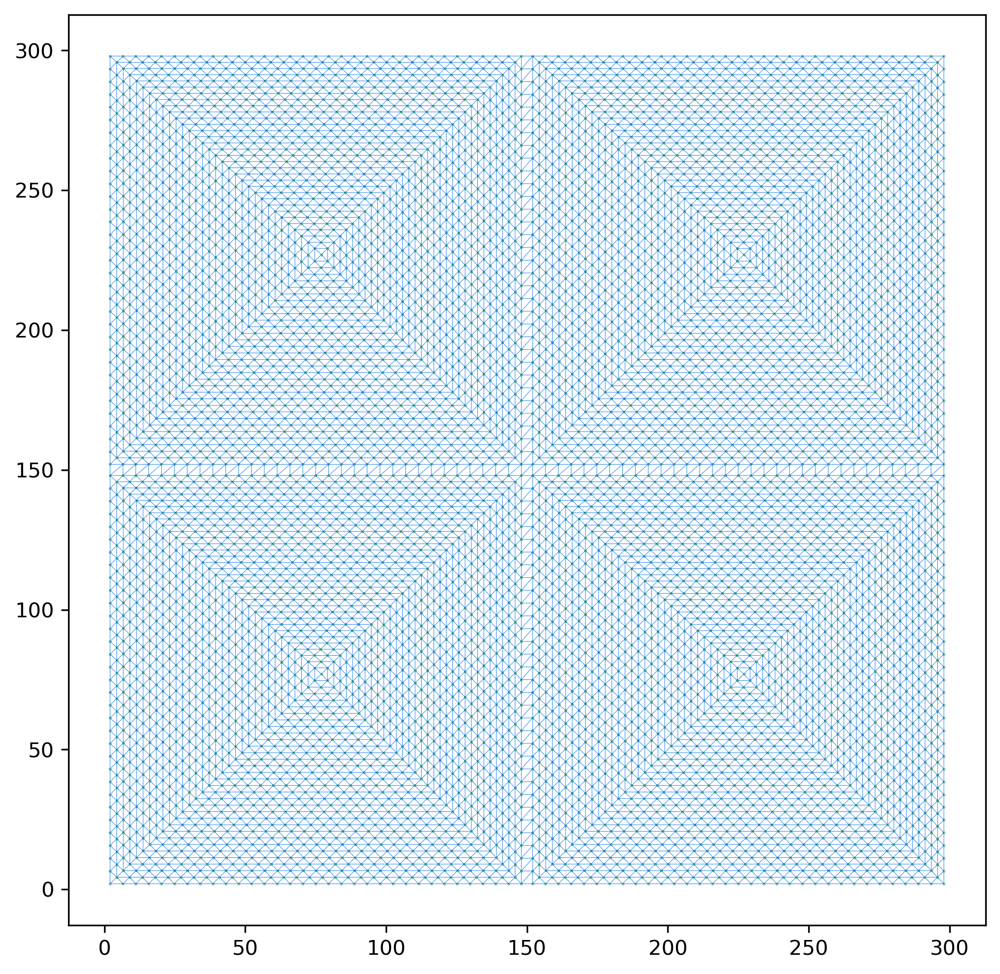

In [4]:
fig, ax = plt.subplots(dpi=300, figsize=(8,8))
i=-1
plot_mesh(ax, meshes[i], level=i, color = "xkcd:deep sky blue", markersize=0.2, lw=0.25)

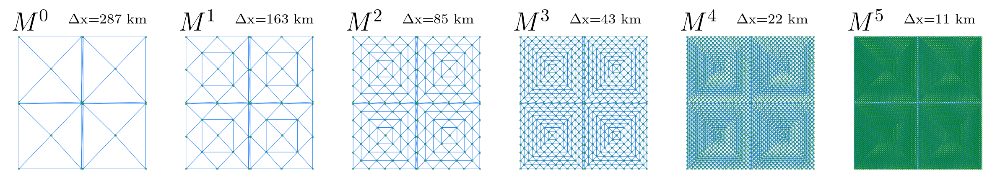

In [5]:
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

fig, axes = plt.subplots(dpi=300, figsize=(10,1.5), ncols=len(meshes))

colors = ["xkcd:sky blue", "xkcd:sky blue", "xkcd:azure", 
          "xkcd:dodger blue", "xkcd:deep sky blue", "xkcd:dark"]

for i in range(len(meshes)):
    plot_mesh(axes[i], meshes[i], level=i, color = "xkcd:deep sky blue", markersize=0.2, lw=0.25)
    axes[i].annotate(rf'$M^{i}$', xy=(0,1), xycoords='axes fraction', fontsize=15)
    axes[i].axis('off')
    max_dist, mean_dist = _get_max_and_mean_edge_distance(meshes[i])
    # Multiply by the 3 km grid spacing
    axes[i].annotate(rf'$\Delta$x={int(mean_dist*3)} km', xy=(0.4, 1.05), xycoords='axes fraction', fontsize=8)
    

(0.0, 150.0)

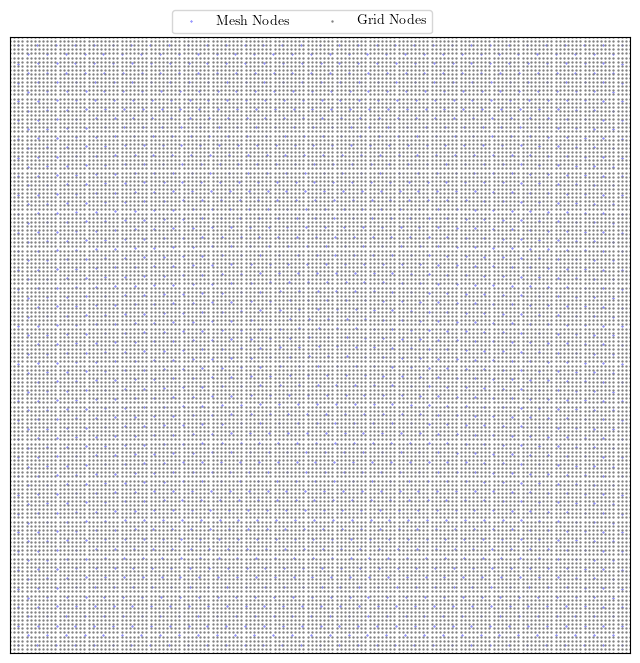

In [6]:
# Convert latitudes and longitudes to Cartesian coordinates
domain_size = 300
grid_positions = square_mesh.get_grid_positions(domain_size)
mesh_positions = meshes[-1].vertices
  
# Plot mesh vertices
fig, ax = plt.subplots(dpi=100, figsize=(8,8))
ax.scatter(mesh_positions[:, 0], mesh_positions[:, 1], color='blue', label='Mesh Nodes', alpha=0.9, s=0.1)
ax.scatter(grid_positions[:, 0], grid_positions[:, 1], color='gray', s=0.5, label='Grid Nodes')

# Add the legend outside the plot
ax.legend(loc='center left', bbox_to_anchor=(0.25, 1.025), ncols=2)

# Annotate the distance between two points
# Define the two points for the annotation
point1 = mesh_positions[0]  # Replace with the actual indices or coordinates
point2 = mesh_positions[1]

# Remove x-ticks and y-ticks
ax.set_xticks([])
ax.set_yticks([])

ax.set_ylim([0,150])
ax.set_xlim([0,150])

## Connect NWP nodes to Mesh nodes on the tiled mesh. 

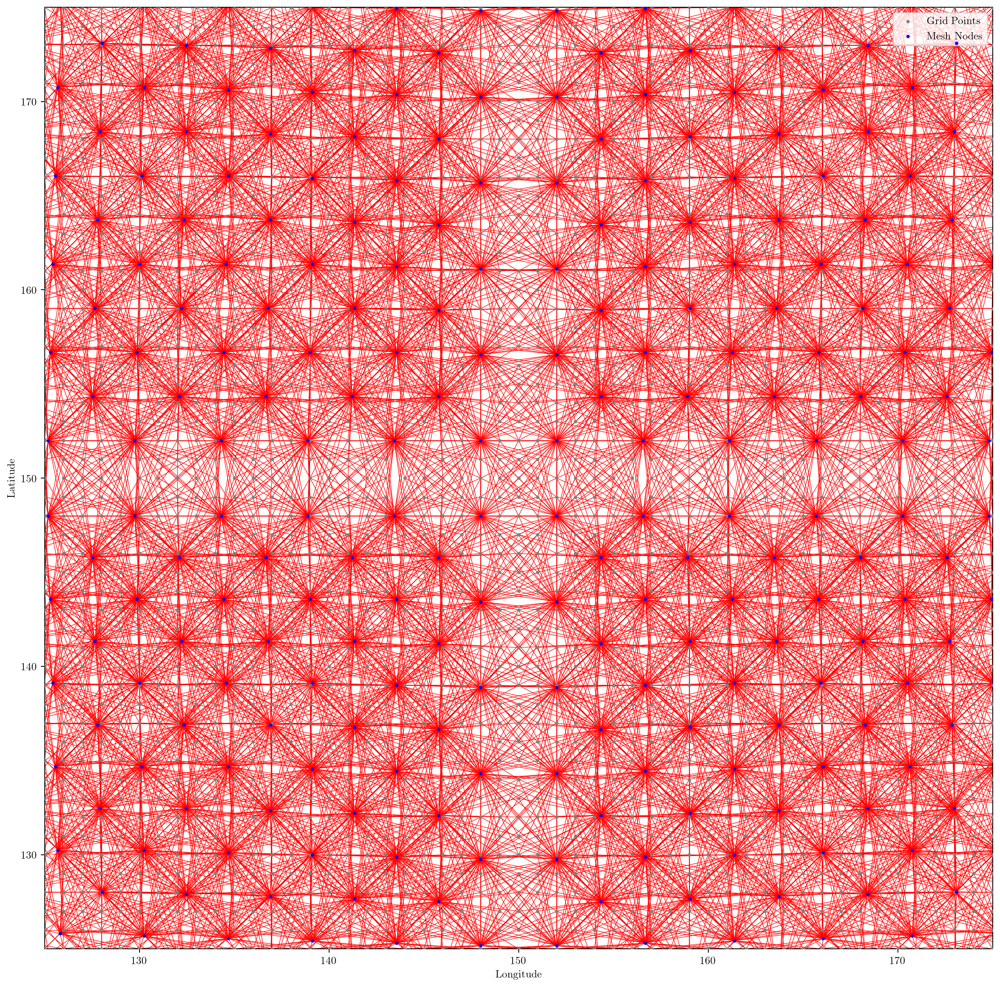

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_connectivity(grid_size, mesh, grid_indices, mesh_indices, xlim=None, ylim=None):
    """
    Plots the connectivity between grid points and mesh nodes within a specified sub-region.
    
    Parameters:
    - grid_size: Size of the grid (assumes square grid)
    - mesh: Mesh object containing vertices
    - grid_indices: Indices of grid points connected to mesh nodes
    - mesh_indices: Indices of mesh nodes connected to grid points
    - xlim: Tuple specifying the x-axis limits (optional)
    - ylim: Tuple specifying the y-axis limits (optional)
    """
    fig, ax = plt.subplots(dpi=200, figsize=(16,16))

    # Generate grid points and plot
    lon, lat = np.meshgrid(np.arange(0, grid_size), np.arange(0, grid_size))

    # Highlight connections within the specified region
    for g_idx, m_idx in zip(grid_indices, mesh_indices):
        grid_point = [lon.flatten()[g_idx], lat.flatten()[g_idx]]
        mesh_node = mesh.vertices[m_idx]
        if (xlim is None or xlim[0] <= grid_point[0] <= xlim[1]) and \
           (ylim is None or ylim[0] <= grid_point[1] <= ylim[1]):
            ax.plot([grid_point[0], mesh_node[0]], [grid_point[1], mesh_node[1]], 'r-', lw=0.5)

    # Scatter plot of grid points
    ax.scatter(lon.flatten(), lat.flatten(), color='gray', 
               s=5, label='Grid Points', alpha=0.9, zorder=5)   
    
    # Scatter plot of mesh vertices
    ax.scatter(mesh.vertices[:, 0], mesh.vertices[:, 1], s=5, 
               color='blue', label='Mesh Nodes', alpha=0.9, zorder=6)
    
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.legend(loc='upper right')
    
    # Set the limits of the plot
    if xlim is not None:
        ax.set_xlim(xlim)
    if ylim is not None:
        ax.set_ylim(ylim)
    
    plt.show()

# Example usage
# Radius is interpreted in the 3 km grid spacing distance. 
domain_size = 300
query_radius=5
grid_indices, mesh_indices = square_mesh.radius_query_indices(domain_size, 
                                                              finest_mesh, 
                                                              radius=query_radius)

plot_connectivity(domain_size, finest_mesh, grid_indices, mesh_indices, xlim=(125, 175), ylim=(125, 175))

In [8]:
# Create some edges according to how the grid nodes are contained by
# mesh triangles.
(these_grid_indices,
     these_mesh_indices) = square_mesh.in_mesh_triangle_indices(
         grid_size=domain_size,
         mesh=finest_mesh)

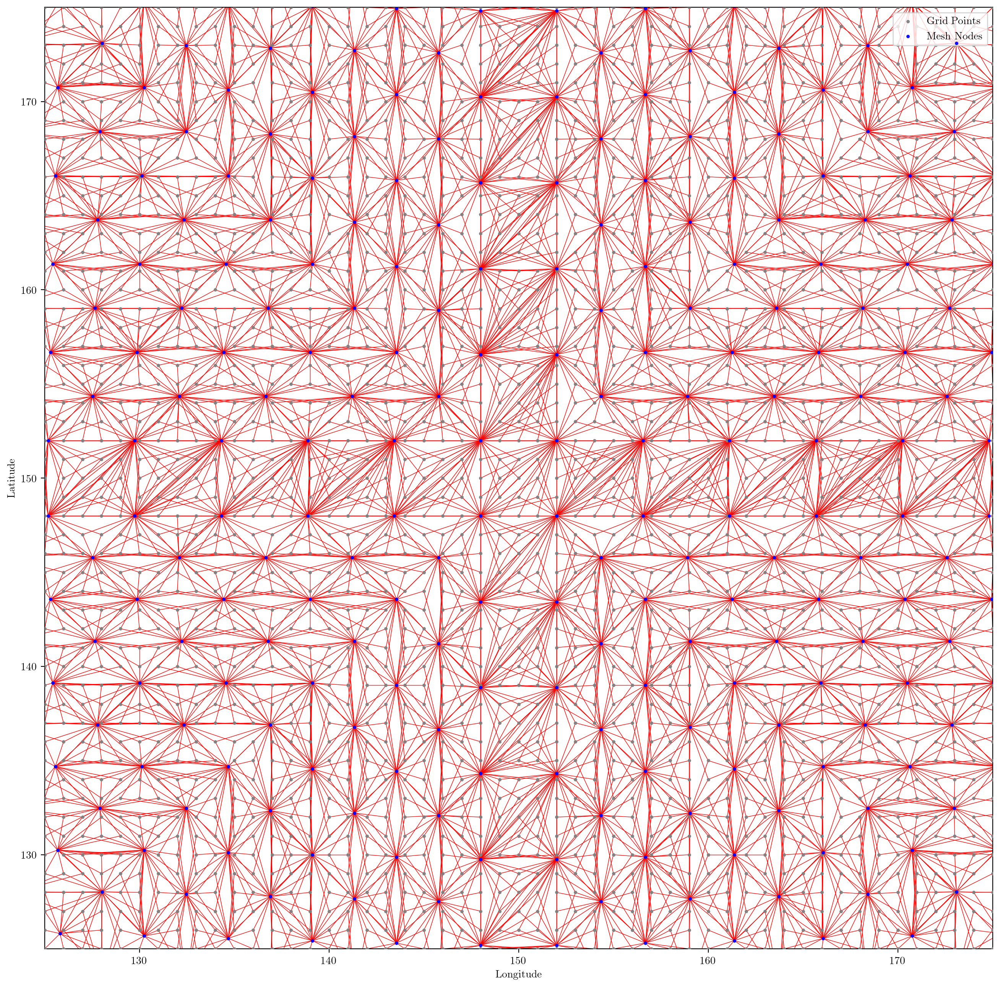

In [9]:
plot_connectivity(domain_size, finest_mesh, 
                  these_grid_indices, these_mesh_indices, xlim=(125, 175), ylim=(125, 175))